In [10]:
#Data Pre-Processing
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scipy import stats

file_path = 'spotify_dataset.csv'
df = pd.read_csv(file_path)

print(df.head())  
print(df.info())  
print(df.describe())  

print("Column names:", df.columns)

df.dropna(inplace=True)

z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
df = df[(z_scores < 3).all(axis=1)]

if 'binary_column' in df.columns:
    le = LabelEncoder()
    df['binary_column'] = le.fit_transform(df['binary_column'])
else:
    print("'binary_column' not found in the DataFrame")

if 'categorical_column' in df.columns:
    df = pd.get_dummies(df, columns=['categorical_column'])
else:
    print("'categorical_column' not found in the DataFrame")

scaler = StandardScaler()
numerical_columns = df.select_dtypes(include=[np.number]).columns
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

print(df.head())


                 track_id                                         track_name  \
0  6f807x0ima9a1j3VPbc7VN  I Don't Care (with Justin Bieber) - Loud Luxur...   
1  0r7CVbZTWZgbTCYdfa2P31                    Memories - Dillon Francis Remix   
2  1z1Hg7Vb0AhHDiEmnDE79l                    All the Time - Don Diablo Remix   
3  75FpbthrwQmzHlBJLuGdC7                  Call You Mine - Keanu Silva Remix   
4  1e8PAfcKUYoKkxPhrHqw4x            Someone You Loved - Future Humans Remix   

       track_artist  track_popularity          track_album_id  \
0        Ed Sheeran                66  2oCs0DGTsRO98Gh5ZSl2Cx   
1          Maroon 5                67  63rPSO264uRjW1X5E6cWv6   
2      Zara Larsson                70  1HoSmj2eLcsrR0vE9gThr4   
3  The Chainsmokers                60  1nqYsOef1yKKuGOVchbsk6   
4     Lewis Capaldi                69  7m7vv9wlQ4i0LFuJiE2zsQ   

                                    track_album_name track_album_release_date  \
0  I Don't Care (with Justin Bieber) [Loud Luxu

<Figure size 1500x1000 with 0 Axes>

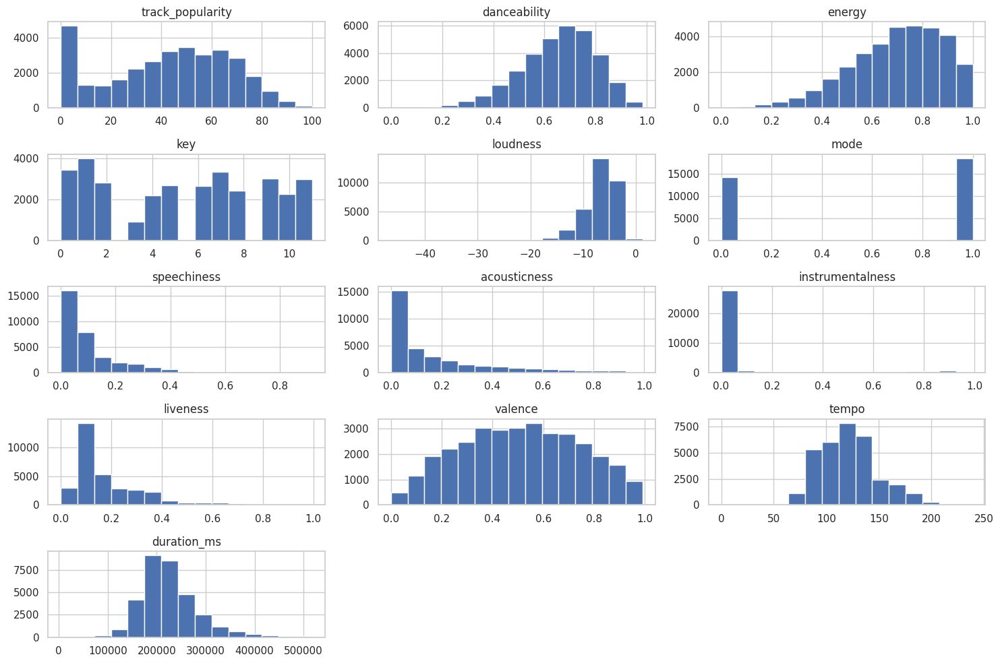

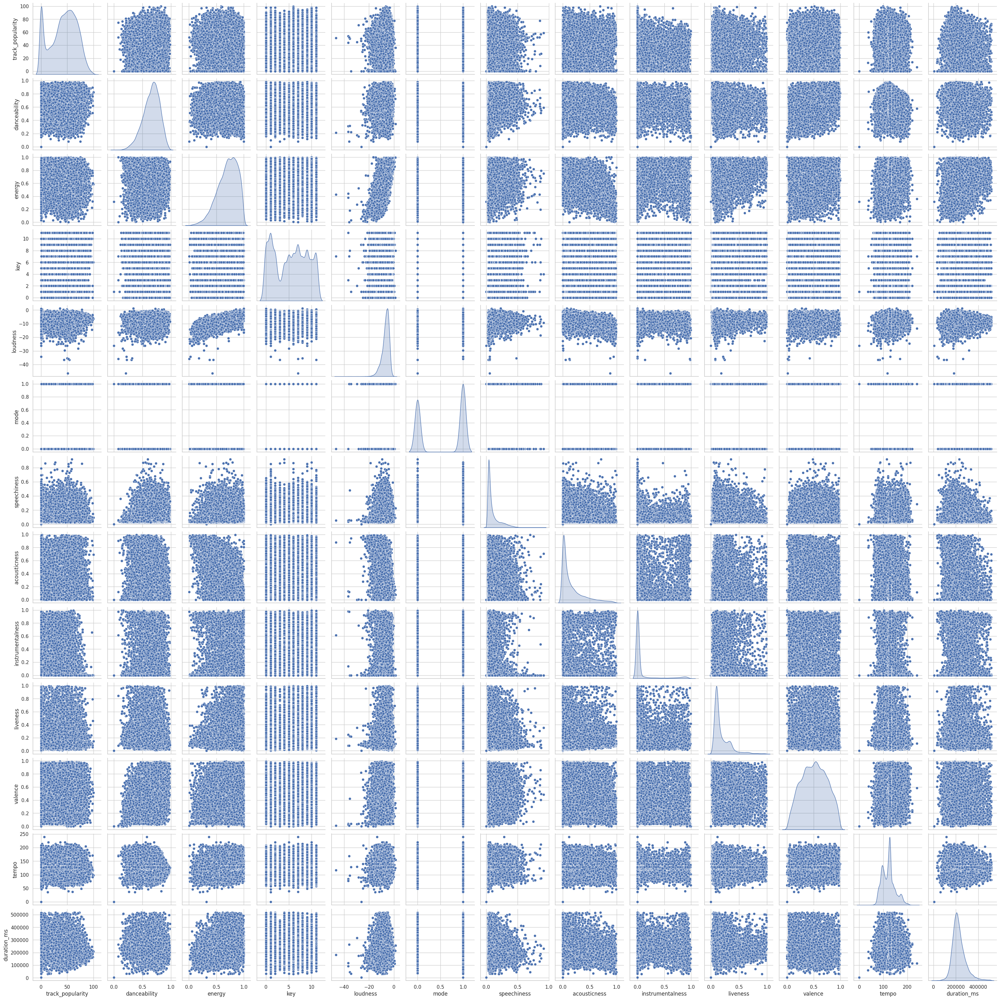

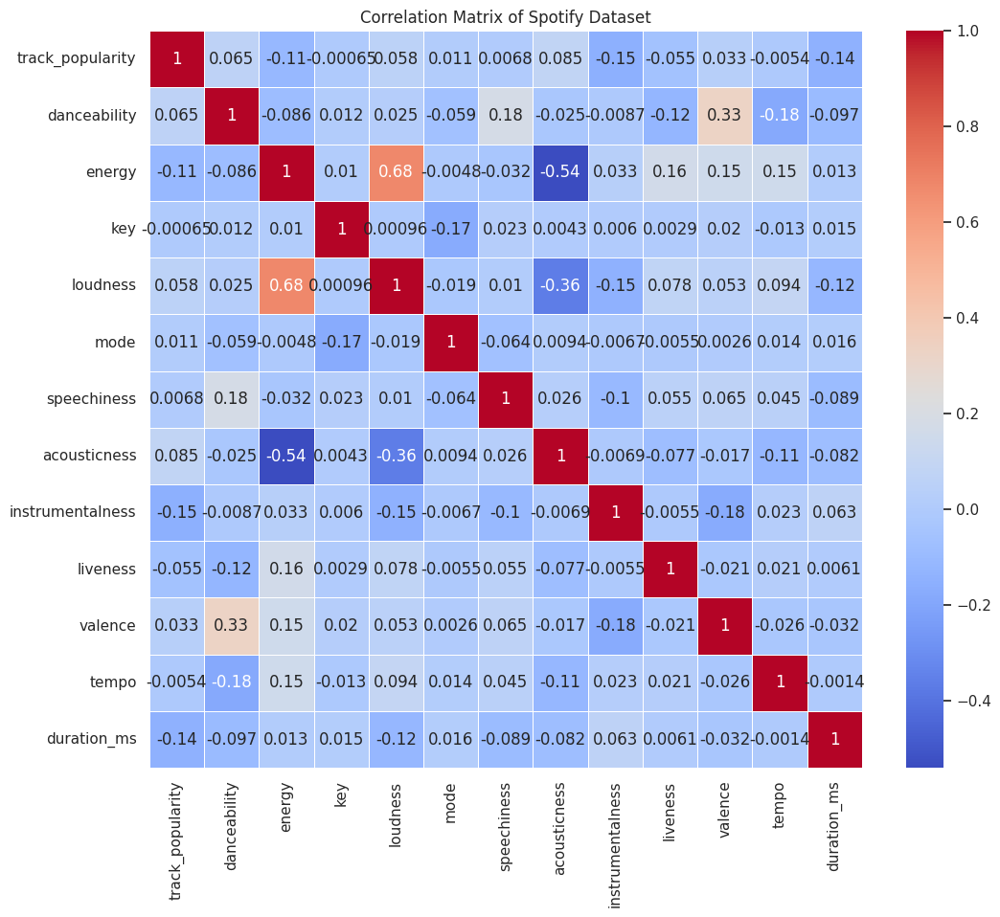

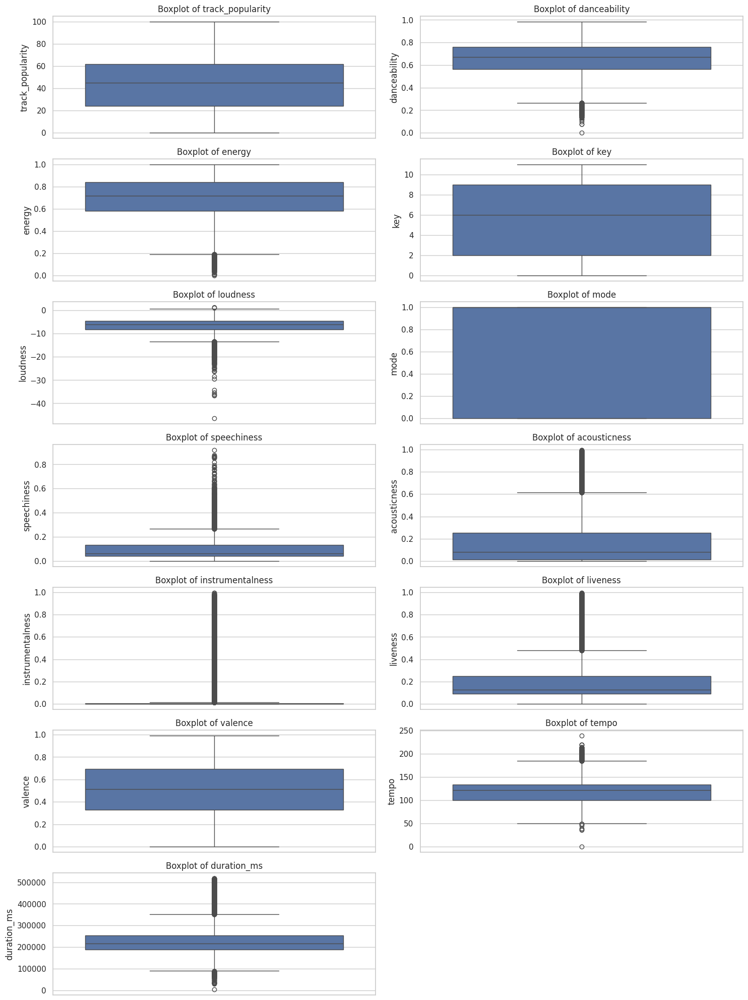

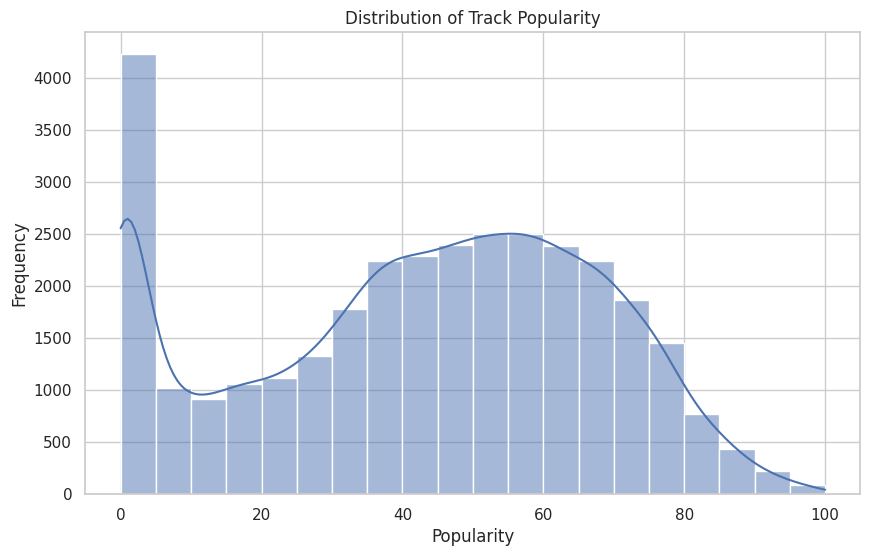

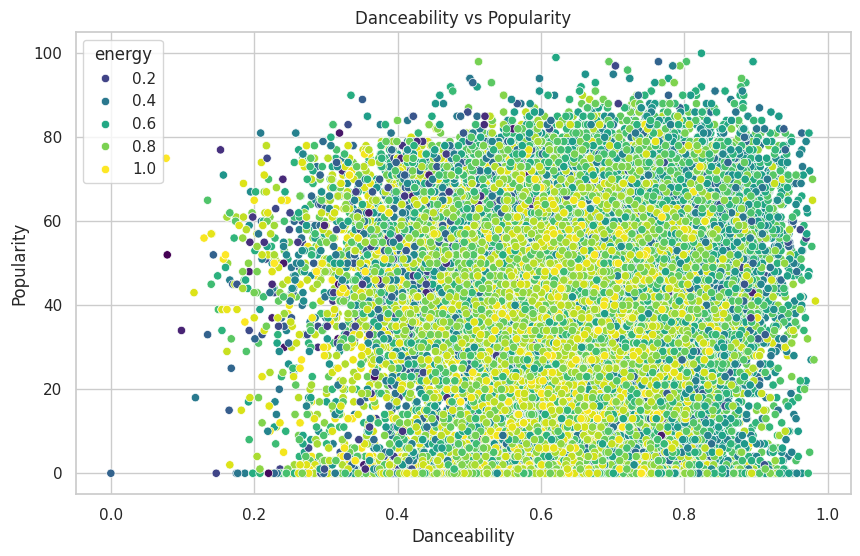

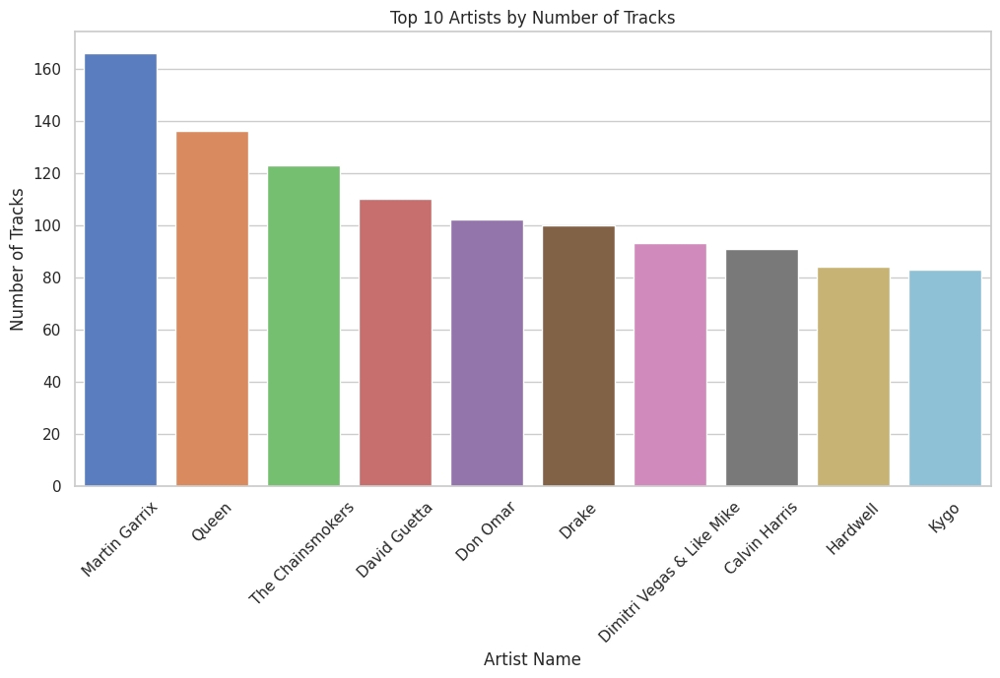

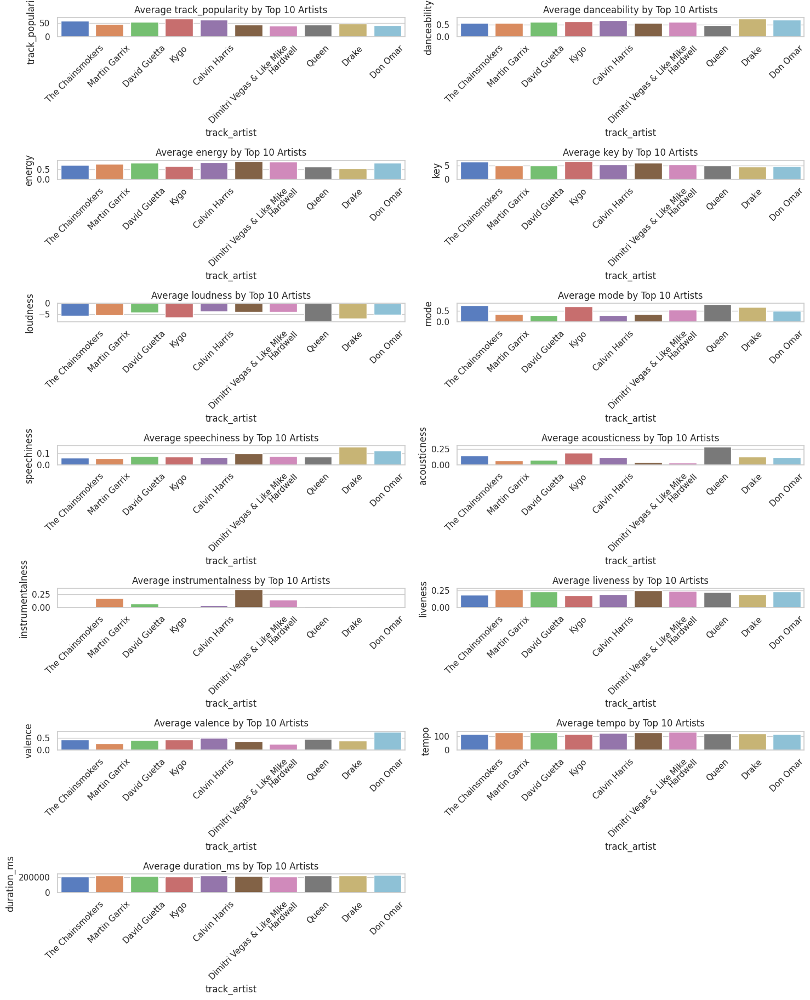

In [9]:
# Data analysis and visualizations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

file_path = 'spotify_dataset.csv'  
df = pd.read_csv(file_path)

# Fill missing values
numeric_columns = df.select_dtypes(include=[np.number]).columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

non_numeric_columns = df.select_dtypes(exclude=[np.number]).columns
for column in non_numeric_columns:
    df[column] = df[column].fillna(df[column].mode()[0])

sns.set(style="whitegrid")

# Plotting various graphs to analyze the data

# 1. Histograms for Numerical Features
num_numeric_columns = len(numeric_columns)
plt.figure(figsize=(15, 10))
df[numeric_columns].hist(bins=15, figsize=(15, 10), layout=(num_numeric_columns // 3 + 1, 3))
plt.tight_layout()
plt.show()

# 2. Pairplot to See Pairwise Relationships
sns.pairplot(df[numeric_columns], diag_kind='kde')
plt.show()

# 3. Correlation Matrix Heatmap
plt.figure(figsize=(12, 10))
corr_matrix = df[numeric_columns].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Spotify Dataset')
plt.show()

# 4. Boxplots for Feature Distributions and Outliers
plt.figure(figsize=(15, 20))  # Increased height
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(num_numeric_columns // 2 + 1, 2, i)  # Changed layout to 2 columns
    sns.boxplot(y=df[column])
    plt.title(f'Boxplot of {column}')
plt.tight_layout()
plt.show()

# 5. Popularity Distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['track_popularity'], bins=20, kde=True)
plt.title('Distribution of Track Popularity')
plt.xlabel('Popularity')
plt.ylabel('Frequency')
plt.show()

# 6. Danceability vs Popularity
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='danceability', y='track_popularity', hue='energy', palette='viridis')
plt.title('Danceability vs Popularity')
plt.xlabel('Danceability')
plt.ylabel('Popularity')
plt.show()

# 7. Top 10 Artists by Number of Tracks
top_artists = df['track_artist'].value_counts().head(10)
top_artists_df = pd.DataFrame({'Artist': top_artists.index, 'Number of Tracks': top_artists.values})
plt.figure(figsize=(12, 6))
sns.barplot(data=top_artists_df, x='Artist', y='Number of Tracks', hue='Artist', dodge=False, palette='muted', legend=False)
plt.title('Top 10 Artists by Number of Tracks')
plt.xlabel('Artist Name')
plt.ylabel('Number of Tracks')
plt.xticks(rotation=45)
plt.show()

# 8. Average Features of Top 10 Artists
top_artists_data = df[df['track_artist'].isin(top_artists.index)]
plt.figure(figsize=(15, 20))  # Increased height
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(num_numeric_columns // 2 + 1, 2, i)  # Changed layout to 2 columns
    sns.barplot(data=top_artists_data, x='track_artist', y=column, estimator=np.mean, errorbar=None, palette='muted', hue='track_artist', dodge=False, legend=False)
    plt.title(f'Average {column} by Top 10 Artists')
    plt.xticks(rotation=45)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


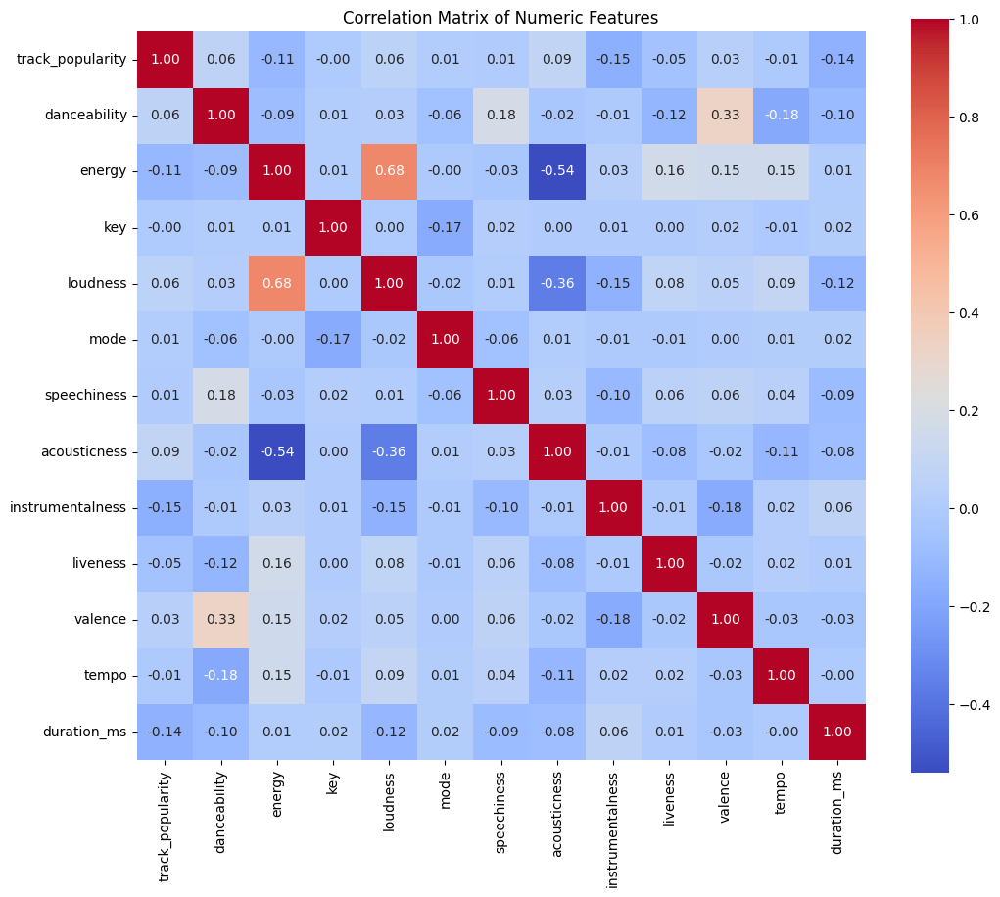

In [3]:
# Correlation Matrix Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

file_path = 'spotify_dataset.csv'
df = pd.read_csv(file_path)

df.dropna(inplace=True) 
df.reset_index(drop=True, inplace=True)  

numeric_columns = df.select_dtypes(include=[np.number]).columns
df_numeric = df[numeric_columns]

correlation_matrix = df_numeric.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
plt.title('Correlation Matrix of Numeric Features')
plt.show()


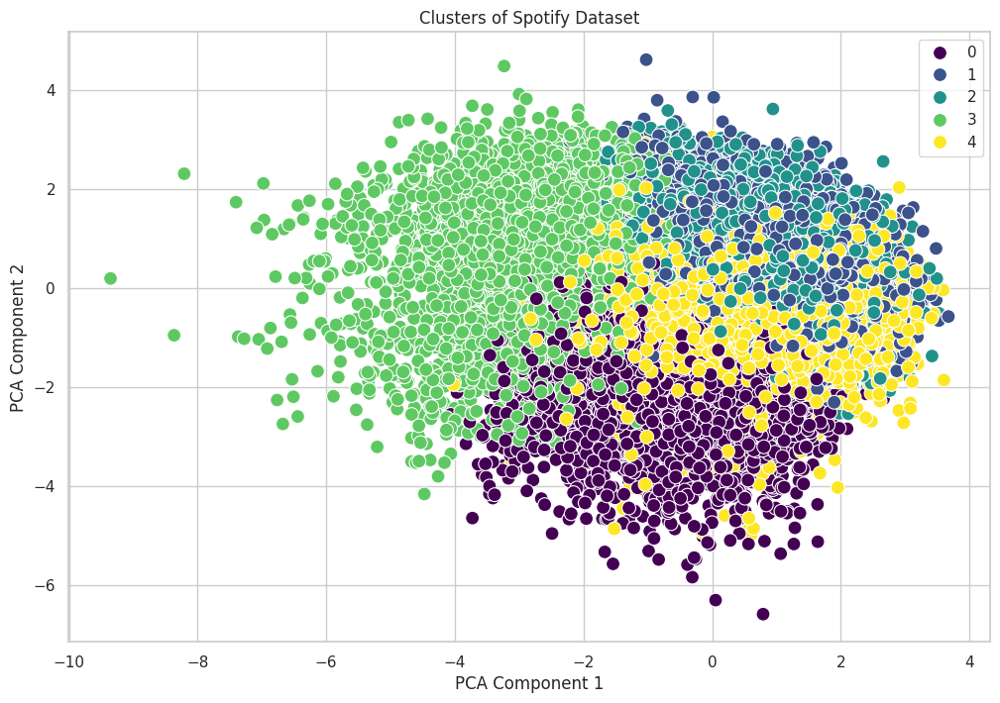

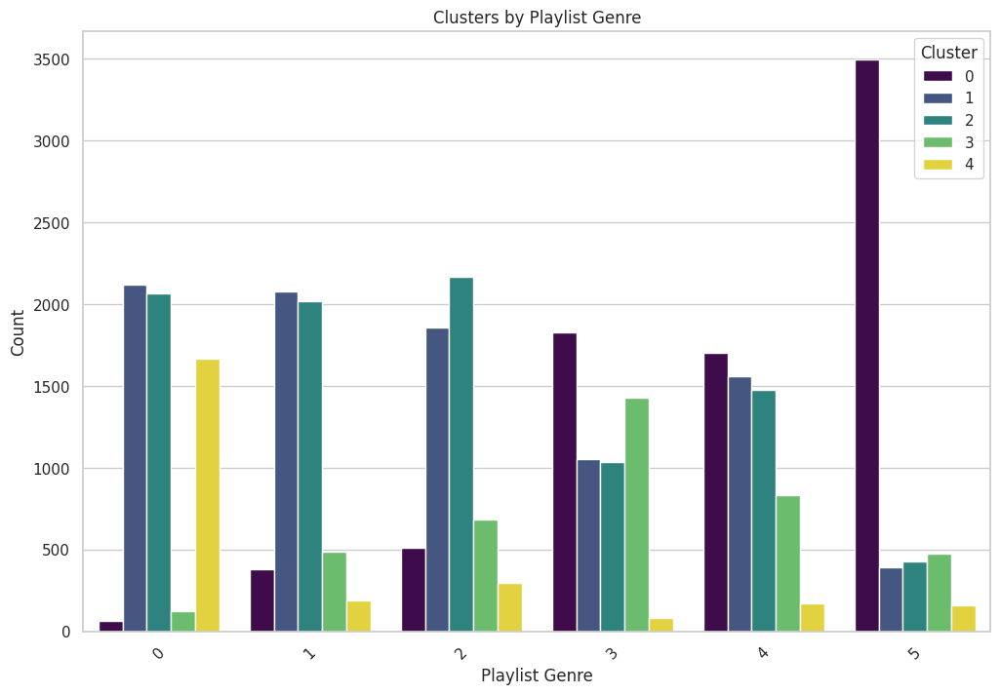

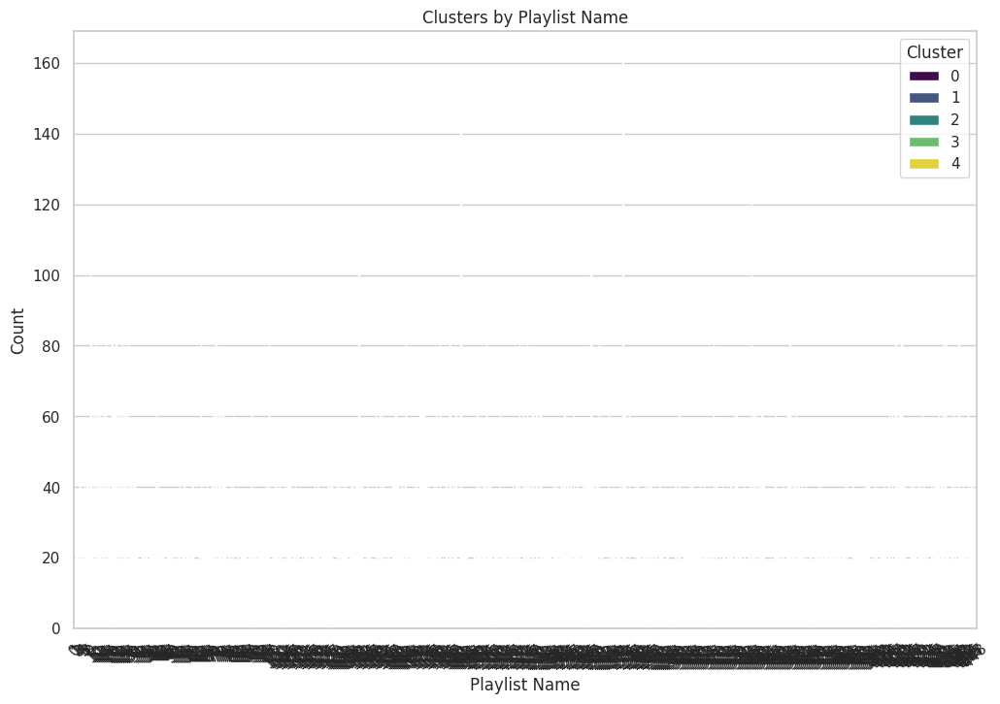

In [10]:
# Data analysis and visualizations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

file_path = 'spotify_dataset.csv'
df = pd.read_csv(file_path)

# Fill missing values
numeric_columns = df.select_dtypes(include=[np.number]).columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

non_numeric_columns = df.select_dtypes(exclude=[np.number]).columns
for column in non_numeric_columns:
    df[column] = df[column].fillna(df[column].mode()[0])

# Encode categorical variables
label_encoder = LabelEncoder()
for column in non_numeric_columns:
    df[column] = label_encoder.fit_transform(df[column])

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Apply KMeans clustering
num_clusters = 5  # Choose the number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
df['Cluster'] = kmeans.fit_predict(df_scaled)

# Visualize clusters using PCA
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_scaled)

df['PCA1'] = df_pca[:, 0]
df['PCA2'] = df_pca[:, 1]

plt.figure(figsize=(12, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=df, palette='viridis', s=100)
plt.title('Clusters of Spotify Dataset')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

# Analyzing clusters based on playlist genres and playlist names
plt.figure(figsize=(12, 8))
sns.countplot(x='playlist_genre', hue='Cluster', data=df, palette='viridis')
plt.title('Clusters by Playlist Genre')
plt.xlabel('Playlist Genre')
plt.ylabel('Count')
plt.legend(title='Cluster')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 8))
sns.countplot(x='playlist_name', hue='Cluster', data=df, palette='viridis')
plt.title('Clusters by Playlist Name')
plt.xlabel('Playlist Name')
plt.ylabel('Count')
plt.legend(title='Cluster')
plt.xticks(rotation=45)
plt.show()


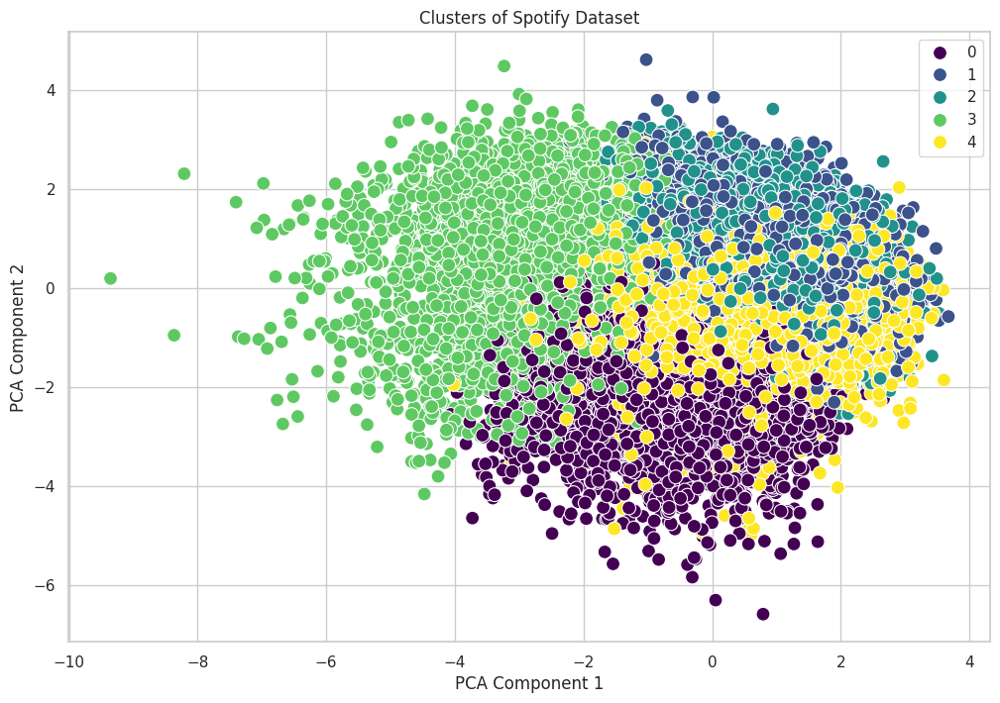

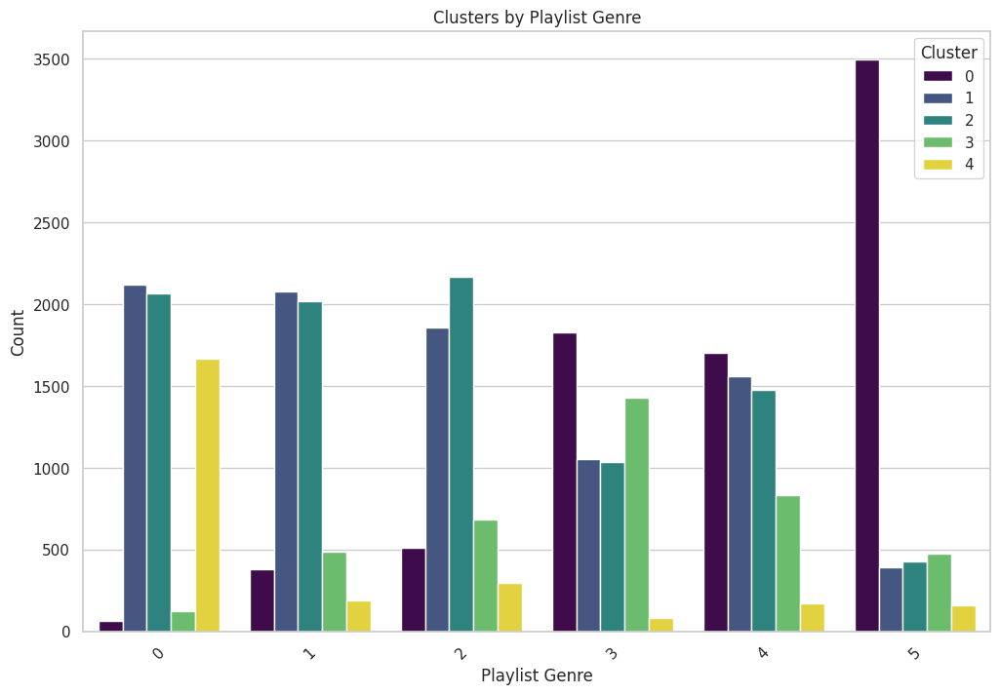

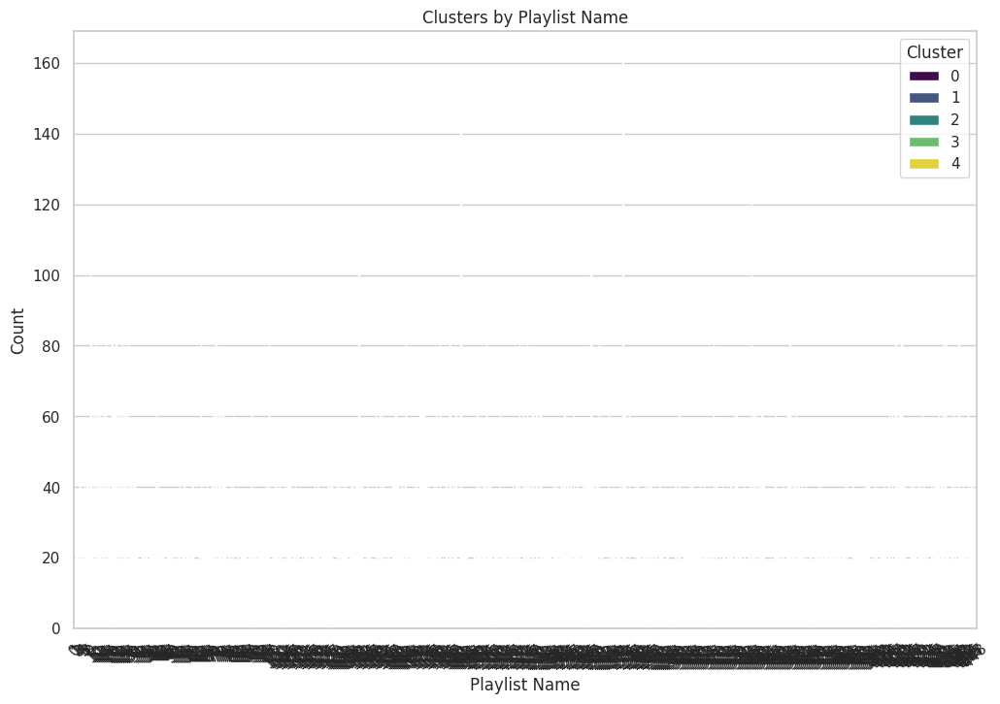

Recommended tracks for track ID 0
      track_name  track_artist  playlist_genre  track_popularity
0           8898          2782               2                66
47          7474          1675               2                57
1233        6035          2889               2                73
5           1919          2782               2                67
717         6900          5751               2                74


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity

# Load the data
file_path = 'spotify_dataset.csv'
df = pd.read_csv(file_path)

# Fill missing values
numeric_columns = df.select_dtypes(include=[np.number]).columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())

non_numeric_columns = df.select_dtypes(exclude=[np.number]).columns
for column in non_numeric_columns:
    df[column] = df[column].fillna(df[column].mode()[0])

# Encode categorical variables
label_encoder = LabelEncoder()
for column in non_numeric_columns:
    df[column] = label_encoder.fit_transform(df[column])

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Apply KMeans clustering
num_clusters = 5  # Choose the number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
df['Cluster'] = kmeans.fit_predict(df_scaled)

# Visualize clusters using PCA
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_scaled)

df['PCA1'] = df_pca[:, 0]
df['PCA2'] = df_pca[:, 1]

plt.figure(figsize=(12, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=df, palette='viridis', s=100)
plt.title('Clusters of Spotify Dataset')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

# Analyzing clusters based on playlist genres and playlist names
plt.figure(figsize=(12, 8))
sns.countplot(x='playlist_genre', hue='Cluster', data=df, palette='viridis')
plt.title('Clusters by Playlist Genre')
plt.xlabel('Playlist Genre')
plt.ylabel('Count')
plt.legend(title='Cluster')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 8))
sns.countplot(x='playlist_name', hue='Cluster', data=df, palette='viridis')
plt.title('Clusters by Playlist Name')
plt.xlabel('Playlist Name')
plt.ylabel('Count')
plt.legend(title='Cluster')
plt.xticks(rotation=45)
plt.show()

# Building the recommendation system
def recommend_tracks(track_id, num_recommendations=5):
    track_cluster = df.loc[track_id, 'Cluster']
    cluster_tracks = df[df['Cluster'] == track_cluster]
    
    track_features = df_scaled[track_id].reshape(1, -1)
    cluster_features = df_scaled[cluster_tracks.index]
    
    similarities = cosine_similarity(track_features, cluster_features).flatten()
    similar_indices = similarities.argsort()[-num_recommendations:][::-1]
    
    recommended_tracks = cluster_tracks.iloc[similar_indices]
    return recommended_tracks

# Test the recommendation system
test_track_id = 0  
recommended_tracks = recommend_tracks(test_track_id, num_recommendations=5)
print("Recommended tracks for track ID", test_track_id)
print(recommended_tracks[['track_name', 'track_artist', 'playlist_genre', 'track_popularity']])
